pip install nltk
pip install spacy

python -m spacy download fr_core_news_sm
python -m nltk.downloader stopwords

In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from bs4 import BeautifulSoup
import os

In [12]:
path = "data"
textes = []
labels = []

for file in os.listdir(path):

    path_file = os.path.join(path, file)

    if os.path.isfile(path_file):

        with open(path_file) as fp:
            soup = BeautifulSoup(fp, "html.parser")

        paragraphes = soup.select("p")
        for p in paragraphes:
            texte = p.get_text()
            textes.append(texte)
            labels.append(file.split("-")[0])

In [13]:
print("Nombre d'échantillons")
print("Balzac :",labels.count("balzac"))
print("Flaubert :",labels.count("flaubert"))
print("Maupassant :",labels.count("maupassant"))
print("Sand :",labels.count("sand"))
print("Zola :",labels.count("zola"))

Nombre d'échantillons
Balzac : 6912
Flaubert : 11028
Maupassant : 6536
Sand : 7309
Zola : 15462


In [14]:
def rassembler_textes_et_labels(textes, labels, taille_minimale=1000):
    textes_rassembles = []
    labels_rassembles = []

    buffer_texte = ""
    buffer_label = ""

    for texte, label in zip(textes, labels):
        if buffer_label == "":
            buffer_label = label

        if buffer_label == label:
            buffer_texte += " " + texte
            if len(buffer_texte) >= taille_minimale:
                textes_rassembles.append(buffer_texte)
                labels_rassembles.append(buffer_label)
                buffer_texte = ""
                buffer_label = ""
        else:
            if len(buffer_texte) >= taille_minimale:
                textes_rassembles.append(buffer_texte)
                labels_rassembles.append(buffer_label)
            buffer_texte = texte
            buffer_label = label

    # Ajoute le dernier échantillon s'il n'a pas été ajouté précédemment et s'il est assez long
    if buffer_label and len(buffer_texte) >= taille_minimale:
        textes_rassembles.append(buffer_texte)
        labels_rassembles.append(buffer_label)

    return textes_rassembles, labels_rassembles

textes_rassembles, labels_rassembles = rassembler_textes_et_labels(textes, labels)

In [17]:
print("Nombre d'échantillons")
print("Balzac :",labels_rassembles.count("balzac"))
print("Flaubert :",labels_rassembles.count("flaubert"))
print("Maupassant :",labels_rassembles.count("maupassant"))
print("Sand :",labels_rassembles.count("sand"))
print("Zola :",labels_rassembles.count("zola"))

Nombre d'échantillons
Balzac : 1667
Flaubert : 1916
Maupassant : 974
Sand : 1927
Zola : 3888


In [23]:
import spacy
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nltk.download('punkt')

# Charger le modèle français de spaCy pour la lemmatisation
nlp = spacy.load("fr_core_news_sm")

# Charger les stop-words français de NLTK
stop_words = set(stopwords.words("french"))

def preprocess(texte):
    # Remplacer les "\n" par des espaces
    texte = texte.replace("\n", " ")

    # Supprimer les caractères spéciaux sauf les points, les virgules, les points d'exclamation et les points d'interrogation
    texte = re.sub(r'[^\w\s.,?!]', '', texte)

    # Tokenisation
    tokens = word_tokenize(texte, language="french")

    # Suppression des stop-words
    tokens = [token for token in tokens if token.lower() not in stop_words]

    # Lemmatisation
    doc = nlp(" ".join(tokens))
    tokens_lemmatizes = [token.lemma_.lower() for token in doc]

    return tokens_lemmatizes

# Appliquer la fonction de prétraitement à chaque échantillon de texte
textes_pretraites = [preprocess(texte) for texte in textes_rassembles]

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Quentin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [30]:
nlp = spacy.load("fr_core_news_sm")

def preprocess_text_spacy(text):
    # Supprimer les caractères spéciaux sauf les points, les virgules, les points d'exclamation et les points d'interrogation
    text = re.sub(r'[^\w\s.,?!]', '', text)

    # Tokeniser, mettre en minuscules, supprimer les stopwords et lemmatiser
    doc = nlp(text)
    tokens = [token.lemma_.lower() for token in doc if not token.is_stop and token.is_alpha]

    # Retourner les éléments prétraités
    return ' '.join(tokens)

textes_preprocessed = [preprocess_text_spacy(text) for text in textes_rassembles]

In [31]:
# Afficher les 10 premiers textes prétraités
for i in range(10):
    print(f"Texte original {i + 1}:\n{textes_rassembles[i]}\n")
    print(f"Texte prétraité {i + 1}:\n{textes_pretraites[i]}\n")
    print("----------------------------------------------------\n")

Texte original 1:
 Au lecteur PARIS.—IMPRIMERIE DE E. MARTINET, RUE MIGNON, 2 TOME 1 LA MAISON DU CHAT-QUI-PELOTE—LE BAL DE SCEAUX
  LA BOURSE—LA VENDETTA—MADAME FIRMIANI
  UNE DOUBLE FAMILLE—LA PAIX DU MÉNAGE—LA FAUSSE MAITRESSE
  ÉTUDE DE FEMME—ALBERT SAVARUS PARIS VE ADRE HOUSSIAUX, ÉDITEUR HÉBERT ET CIE, SUCCESSEURS 7, RUE PERRONET, 7 1874 1 Balzac naquit à Tours le 16 mai 1799, le jour de la fête de saint
Honoré, dont on lui donna le nom, qui parut bien sonnant et de bon
augure. Le petit Honoré ne fut pas un enfant prodige; il n'annonça pas
prématurément qu'il ferait la Comédie humaine. C'était un garçon
frais, vermeil, bien portant, joueur, aux yeux brillants et doux, mais
que rien ne distinguait des autres, du moins à des regards peu
attentifs. A sept ans, au sortir d'un externat de Tours, on le mit au
collége de Vendôme, tenu par des oratoriens, où il passa pour un élève
très-médiocre. La première partie de Louis Lambert contient sur ce temps de la vie de
Balzac de curieux rens

In [8]:
print(textes[10])

Balzac naquit à Tours le 16 mai 1799, le jour de la fête de saint
Honoré, dont on lui donna le nom, qui parut bien sonnant et de bon
augure. Le petit Honoré ne fut pas un enfant prodige; il n'annonça pas
prématurément qu'il ferait la Comédie humaine. C'était un garçon
frais, vermeil, bien portant, joueur, aux yeux brillants et doux, mais
que rien ne distinguait des autres, du moins à des regards peu
attentifs. A sept ans, au sortir d'un externat de Tours, on le mit au
collége de Vendôme, tenu par des oratoriens, où il passa pour un élève
très-médiocre.


In [9]:
def preprocess(texte, label):
    merged_text = []
    merged_label = []

    current_text = ""
    current_label = label[0]
    i=0

    
    while len(current_text)<1000 and current_label==label[i]:
        while i<len(texte):
            current_text = current_text + " " + texte[i]
            print(i)
            i+=1
        merged_text.append(current_text)
        merged_label.append(current_label)
        current_text = ""
        if i==len(texte)-1:
            return merged_text, merged_label 
        current_label=label[i]
    

In [10]:
new_txt, new_labels = preprocess(textes, labels)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

IndexError: list index out of range

In [15]:
len(labels)

47247

In [23]:
new_txt[0]

' Au lecteur PARIS.—IMPRIMERIE DE E. MARTINET, RUE MIGNON, 2 TOME 1 LA MAISON DU CHAT-QUI-PELOTE—LE BAL DE SCEAUX\n  LA BOURSE—LA VENDETTA—MADAME FIRMIANI\n  UNE DOUBLE FAMILLE—LA PAIX DU MÉNAGE—LA FAUSSE MAITRESSE\n  ÉTUDE DE FEMME—ALBERT SAVARUS PARIS VE ADRE HOUSSIAUX, ÉDITEUR HÉBERT ET CIE, SUCCESSEURS 7, RUE PERRONET, 7 1874 1 Balzac naquit à Tours le 16 mai 1799, le jour de la fête de saint\nHonoré, dont on lui donna le nom, qui parut bien sonnant et de bon\naugure. Le petit Honoré ne fut pas un enfant prodige; il n\'annonça pas\nprématurément qu\'il ferait la Comédie humaine. C\'était un garçon\nfrais, vermeil, bien portant, joueur, aux yeux brillants et doux, mais\nque rien ne distinguait des autres, du moins à des regards peu\nattentifs. A sept ans, au sortir d\'un externat de Tours, on le mit au\ncollége de Vendôme, tenu par des oratoriens, où il passa pour un élève\ntrès-médiocre. La première partie de Louis Lambert contient sur ce temps de la vie de\nBalzac de curieux rense

In [37]:
from sklearn.feature_extraction.text import TfidfVectorizer

nltk.download('stopwords')
from nltk.corpus import stopwords
french_stopwords = set(stopwords.words('french'))

def remove_stopwords(text, stopwords):
    words = text.split()
    cleaned_words = [word for word in words if word.lower() not in stopwords]
    return ' '.join(cleaned_words)

cleaned_textes = [remove_stopwords(text, french_stopwords) for text in textes]

vectorizer = TfidfVectorizer()  # Utilisez 'french' pour les stop-words en français
X = vectorizer.fit_transform(cleaned_textes)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Quentin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [38]:
# Afficher les 10 premiers textes prétraités
for i in range(10):
    print(f"Texte original {i + 1}:\n{textes_rassembles[i]}\n")
    print(f"Texte prétraité {i + 1}:\n{X[i]}\n")
    print("----------------------------------------------------\n")

Texte original 1:
 Au lecteur PARIS.—IMPRIMERIE DE E. MARTINET, RUE MIGNON, 2 TOME 1 LA MAISON DU CHAT-QUI-PELOTE—LE BAL DE SCEAUX
  LA BOURSE—LA VENDETTA—MADAME FIRMIANI
  UNE DOUBLE FAMILLE—LA PAIX DU MÉNAGE—LA FAUSSE MAITRESSE
  ÉTUDE DE FEMME—ALBERT SAVARUS PARIS VE ADRE HOUSSIAUX, ÉDITEUR HÉBERT ET CIE, SUCCESSEURS 7, RUE PERRONET, 7 1874 1 Balzac naquit à Tours le 16 mai 1799, le jour de la fête de saint
Honoré, dont on lui donna le nom, qui parut bien sonnant et de bon
augure. Le petit Honoré ne fut pas un enfant prodige; il n'annonça pas
prématurément qu'il ferait la Comédie humaine. C'était un garçon
frais, vermeil, bien portant, joueur, aux yeux brillants et doux, mais
que rien ne distinguait des autres, du moins à des regards peu
attentifs. A sept ans, au sortir d'un externat de Tours, on le mit au
collége de Vendôme, tenu par des oratoriens, où il passa pour un élève
très-médiocre. La première partie de Louis Lambert contient sur ce temps de la vie de
Balzac de curieux rens

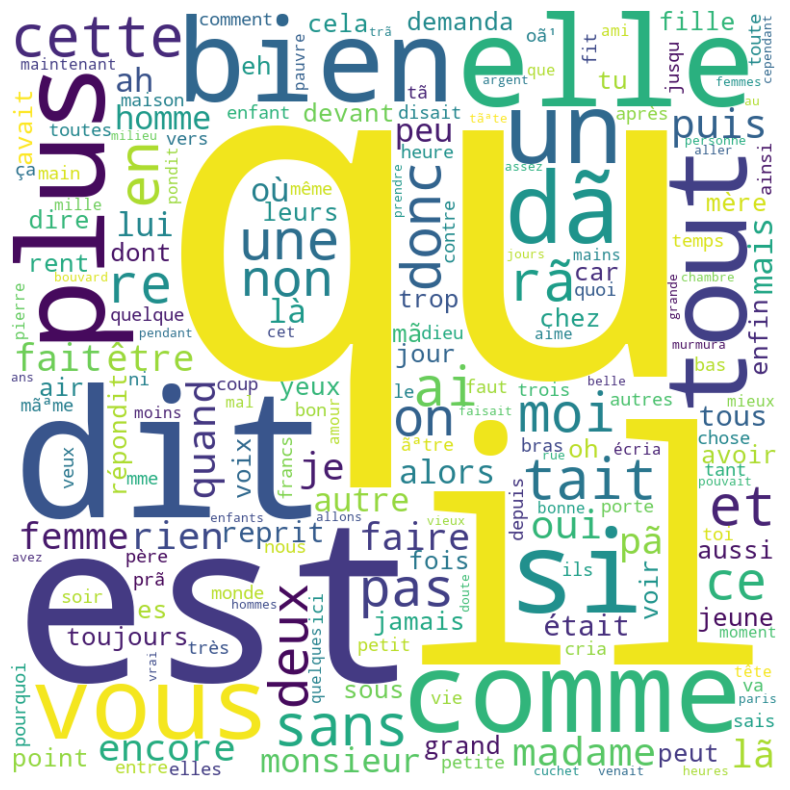

In [46]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np

mean_tfidf_scores = np.mean(X.toarray(), axis=0)
word_scores = {word: mean_tfidf_scores[index] for word, index in vectorizer.vocabulary_.items()}

wordcloud = WordCloud(width=800, height=800, background_color='white', colormap='viridis').generate_from_frequencies(word_scores)

plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
# Création d'un pipeline pour la transformation des données et l'entraînement du modèle
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),  # Transformation des textes en vecteurs TF-IDF
    ('classifier', LogisticRegression(solver='liblinear'))  # Classification avec la régression logistique
])

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(textes, labels, test_size=0.2, random_state=42)

# Entraînement du modèle
pipeline.fit(X_train, y_train)

# Prédiction et évaluation du modèle
y_pred = pipeline.predict(X_test)

with open('output.txt', 'w') as f:
    print("Rapport de classification:\n", classification_report(y_test, y_pred), file=f)
    print("Matrice de confusion:\n", confusion_matrix(y_test, y_pred), file=f)

In [25]:
len(new_txt)

1